In [1]:
# The code was removed by Watson Studio for sharing.

In [2]:
import numpy as np
import random
import pandas as pd

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.options.mode.chained_assignment = None

## The following files have been created separately and have been uploaded to project workspace
    DubPostCodes.csv #contains centroid location co-ordinates for Dublin PostCodes
    DubNhood.csv #contains centroid location co-ordinates for Dublin Neighbourhooods within PostCodes
    DubPPR2018.csv #Filtered and cleansed records for properties sold in 2018 in Dublin county only
    dublinplus_geo.json #custom geojson file for Dublin including larger Co Dublin neighbourhoods
    

In [3]:
!conda install -c conda-forge folium --yes
import folium

Fetching package metadata .............
Solving package specifications: .

Package plan for installation in environment /opt/conda/envs/DSX-Python35:

The following NEW packages will be INSTALLED:

    altair:  2.2.2-py35_1 conda-forge
    branca:  0.3.0-py_0   conda-forge
    folium:  0.6.0-py_0   conda-forge
    vincent: 0.4.4-py_1   conda-forge

altair-2.2.2-p 100% |################################| Time: 0:00:00   1.18 MB/s
branca-0.3.0-p 100% |################################| Time: 0:00:00  25.39 MB/s
vincent-0.4.4- 100% |################################| Time: 0:00:00  34.39 MB/s
folium-0.6.0-p 100% |################################| Time: 0:00:00  38.29 MB/s


In [4]:
#import math
csv_file = project.get_file("DubPPR2018.csv")
csv_file.seek(0)
df_filt2018 = pd.read_csv(csv_file)
#Convert SaleDate to DateTime type
df_filt2018['SaleDate'] = pd.to_datetime(df_filt2018['SaleDate'],format="%d/%m/%Y")
#Reset Location/Neibourhood NaN values
df_filt2018['Location']=df_filt2018['Location'].fillna('')
df_filt2018['Neighbourhood']=df_filt2018['Neighbourhood'].fillna('')
#Adjust Vat Incl price for new builds 13.5% Vat Rate -- Already done and saved/retrieved so comment line
#df_filt2018['Price'] = df_filt2018.apply(lambda row: math.ceil(row['Price']*113.5)/100.0 if (row['VATExcl'] == 1) else row['Price'],axis=1) #,ignore_failures=True

df_filt2018.head(5)

,SaleDate,Address,Neighbourhood,PostCode,County,Location,Price,FullMarketPrice,VATExcl,PropDesc,SizeDesc
0,2018-01-02,19 Ulverton Rd,Dalkey,Co Dublin,Dublin,"53.2809791, -6.107143",1130000.0,0,0,Old,000 - 000
1,2018-01-02,"1 Abbey St, Howth",Howth,Dublin 7,Dublin,"53.3872364, -6.0655199",710000.0,0,0,Old,000 - 000
2,2018-01-02,"1 Roseville, Lower Road",Shankill,Dublin 18,Dublin,"53.233132, -6.125343",627230.7,0,0,Old,000 - 000
3,2018-01-02,51A St Patricks Crescent,Monkstown,Co Dublin,Dublin,"53.2844546, -6.1493957",545000.0,0,0,Old,000 - 000
4,2018-01-02,89 Cromwellsfort Rd,Walkinstown,Dublin 12,Dublin,"53.3171806, -6.3324025",350000.0,0,0,Old,000 - 000


In [5]:
#df_filt2018[df_filt2018.VATExcl==1].head() #(Ex-Vat old results)
df_map=df_filt2018.groupby(['PostCode']).agg({"PropDesc":"count", "Price":"mean"}).reset_index()
#       .rename(columns={'text':'count','sent':'mean_sent'}) \{'Avg':'mean', 'Freq':'count', 'MaxPrice':'max', 'MinPrice':'min'}).reset_index()
df_map.head()

,PostCode,Price,PropDesc
0,Co Dublin,466527.169962,2933
1,Dublin 1,503898.089067,225
2,Dublin 10,188080.450085,117
3,Dublin 11,372728.780091,331
4,Dublin 12,352787.967164,402


In [6]:
df_map[['Price','PropDesc']].corr()

,Price,PropDesc
Price,1.000000,0.029528
PropDesc,0.029528,1.000000


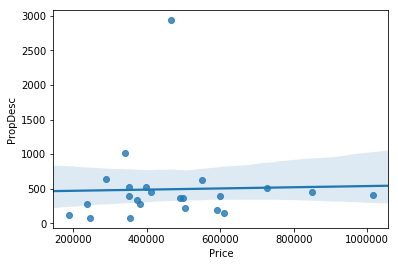

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline 

sns.regplot(x="Price", y="PropDesc", data=df_map)

In [8]:
from folium import plugins

dubLat=53.3497645
dubLong=-6.2602732

# Import custom geojson for Dublin with post code boundaries
dublin_geojson = project.get_file("dublinplus_geo.json").read().decode("utf-8")

dublin_map = folium.Map(location=[dubLat,dubLong], zoom_start=11, tiles='OpenStreetMap')

# instantiate a mark cluster object for the properties in the dataframe
props = plugins.MarkerCluster().add_to(dublin_map)

# loop through the dataframe and add each data point to the mark cluster
for latlng, label, in zip(df_filt2018.Location.str.split(','),df_filt2018.PostCode+' : ' + df_filt2018.SaleDate.astype(str)+' : €'+df_filt2018.Price.astype(str)):
    folium.Marker(
        location=[float(i) for i in latlng],
        icon=None,
        popup=label,
    ).add_to(props)

dublin_map.choropleth(
    geo_data=dublin_geojson,
    data=df_map,
    columns=['PostCode', 'Price'],
    key_on='feature.properties.postal',
    fill_color='PuBuGn', #'YlGnBu', 'YlOrBr', 'YlOrRd' other triple colour scheme options
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Dublin Property Prices 2018',
    reset=True
)

#project.save_data("DublinPPR2018a.html", dublin_map.get_root().render(), overwrite=True)
dublin_map


In [9]:
VERSION='20181030'
LIMIT = 25 # limit of number of venues returned by Foursquare API
radius = 5000 # define radius
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    dubLat, 
    dubLong, 
    radius, 
    LIMIT)

In [10]:
import requests # url request
import json # library to handle JSON files
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

results = requests.get(url).json()

In [11]:
def getNearbyVenues(names, location, radius=500):
    
    venues_list=[]

    for name, latlng in zip(names, location):
        #print(name)
        lat = float(latlng.split(',')[0])
        lng = float(latlng.split(',')[-1])
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [12]:
#Summarise by postcode + neighbourhood and determine property count and average price
df_nhood=df_filt2018[(df_filt2018['Neighbourhood']>'') & (df_filt2018['PropDesc']=='Old')].groupby(['PostCode','Neighbourhood']).agg({"PropDesc":"count", "Price":"mean"}).reset_index()
#Eliminate neighbourhoods with less than 10 properties as this skews and too low a sample
#df_nhood=df_nhood[df_nhood.PropDesc>=10]
df_nhood.head()

,PostCode,Neighbourhood,Price,PropDesc
0,Co Dublin,Adamstown,216999.250000,8
1,Co Dublin,Balbriggan,210566.631905,147
2,Co Dublin,Ballyboughal,569000.000000,1
3,Co Dublin,Ballybrack,332517.241379,29
4,Co Dublin,Ballycullen,394500.000000,3


In [13]:
nhood_csv=project.get_file("DubNhood.csv") #Load Neighbourhood lookup with centred location co-ordinates
nhood_csv.seek(0)
df_ncsv = pd.read_csv(nhood_csv)
df_ncsv.head()

,PostCode,Neighbourhood,Location
0,Dublin 1,Abbey Street,"53.3486882, -6.2578235"
1,Dublin 1,Amiens street,"53.3528355, -6.2487534"
2,Dublin 1,Capel street,"53.3474219, -6.2684092"
3,Dublin 1,Dorset street,"53.3585094, -6.2627738"
4,Dublin 1,Henry street,"53.3495488, -6.2619787"


In [14]:
df_dub=pd.merge(df_nhood,df_ncsv, left_on=['PostCode','Neighbourhood'], right_on = ['PostCode','Neighbourhood'])
df_dub = df_dub.rename(columns={'PropDesc': 'PropCount'})
df_dub.head()

,PostCode,Neighbourhood,Price,PropCount,Location
0,Co Dublin,Adamstown,216999.250000,8,"53.3360017, -6.4692321"
1,Co Dublin,Balbriggan,210566.631905,147,"53.609832, -6.1861964"
2,Co Dublin,Ballybrack,332517.241379,29,"53.252448, -6.1266112"
3,Co Dublin,Balrothery,334200.000000,5,"53.5877338, -6.1880637"
4,Co Dublin,Blackrock,751842.048544,206,"53.3018639, -6.1788342"


In [15]:
dub_venues = getNearbyVenues(names=df_dub['Neighbourhood'],
                             location=df_dub['Location']
                            )
print(dub_venues.shape)
dub_venues.head()

(1363, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Adamstown,53.336002,-6.469232,Adamstown Railway Station,53.337099,-6.462584,Train Station
1,Balbriggan,53.609832,-6.186196,Thai Gourment,53.610310,-6.182511,Thai Restaurant
2,Balbriggan,53.609832,-6.186196,Bracken Court Hotel,53.608730,-6.183065,Hotel
3,Balbriggan,53.609832,-6.186196,Smak Domu (European Food Shop),53.610187,-6.183207,Food Court
4,Balbriggan,53.609832,-6.186196,Apache Pizza,53.611268,-6.185630,Pizza Place


In [16]:
# one hot encoding
dub_onehot = pd.get_dummies(dub_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
dub_onehot['Neighborhood'] = dub_venues['Neighborhood']
# move neighborhood column to the first column
fixed_columns = [dub_onehot.columns[-1]] + list(dub_onehot.columns[:-1])
dub_onehot = dub_onehot[fixed_columns]
dub_onehot.head()

,Neighborhood,Accessories Store,American Restaurant,Arcade,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auto Garage,BBQ Joint,Bakery,Bar,Beach,Bed & Breakfast,Beer Bar,Betting Shop,Bistro,Boat or Ferry,Bookstore,Bowling Alley,Breakfast Spot,Brewery,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Stop,Business Service,Butcher,Cafeteria,Café,Castle,Chinese Restaurant,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,Comedy Club,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Cricket Ground,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Dive Bar,Donut Shop,Electronics Store,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Fondue Restaurant,Food & Drink Shop,Food Court,Fountain,French Restaurant,Fried Chicken Joint,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Harbor / Marina,Hardware Store,Health Food Store,Hill,Historic Site,History Museum,Hockey Arena,Hockey Field,Home Service,Hostel,Hotel,Hotel Bar,Hotel Pool,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indoor Play Area,Insurance Office,Irish Pub,Italian Restaurant,Japanese Restaurant,Juice Bar,Lake,Lawyer,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Market,Medical Center,Mediterranean Restaurant,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Mountain,Movie Theater,Moving Target,Multiplex,Museum,Music Venue,Nail Salon,Nightclub,Outdoor Supply Store,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Pet Store,Pharmacy,Pizza Place,Platform,Playground,Plaza,Pool,Portuguese Restaurant,Post Office,Pub,Racetrack,Rental Car Location,Rental Service,Restaurant,Rugby Pitch,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shop & Service,Shopping Mall,Shopping Plaza,Skating Rink,Soccer Field,Soccer Stadium,Spa,Sporting Goods Shop,Sports Club,Stadium,Steakhouse,Supermarket,Sushi Restaurant,Tapas Restaurant,Tea Room,Tennis Court,Thai Restaurant,Theater,Track,Train Station,Tram Station,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Warehouse Store,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio,Zoo Exhibit
0,Adamstown,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
1,Balbriggan,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Balbriggan,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Balbriggan,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [17]:
dub_grouped = dub_onehot.groupby('Neighborhood').mean().reset_index()
dub_grouped

,Neighborhood,Accessories Store,American Restaurant,Arcade,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auto Garage,BBQ Joint,Bakery,Bar,Beach,Bed & Breakfast,Beer Bar,Betting Shop,Bistro,Boat or Ferry,Bookstore,Bowling Alley,Breakfast Spot,Brewery,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Stop,Business Service,Butcher,Cafeteria,Café,Castle,Chinese Restaurant,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,Comedy Club,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Cricket Ground,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Dive Bar,Donut Shop,Electronics Store,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Fondue Restaurant,Food & Drink Shop,Food Court,Fountain,French Restaurant,Fried Chicken Joint,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Harbor / Marina,Hardware Store,Health Food Store,Hill,Historic Site,History Museum,Hockey Arena,Hockey Field,Home Service,Hostel,Hotel,Hotel Bar,Hotel Pool,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indoor Play Area,Insurance Office,Irish Pub,Italian Restaurant,Japanese Restaurant,Juice Bar,Lake,Lawyer,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Market,Medical Center,Mediterranean Restaurant,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Mountain,Movie Theater,Moving Target,Multiplex,Museum,Music Venue,Nail Salon,Nightclub,Outdoor Supply Store,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Pet Store,Pharmacy,Pizza Place,Platform,Playground,Plaza,Pool,Portuguese Restaurant,Post Office,Pub,Racetrack,Rental Car Location,Rental Service,Restaurant,Rugby Pitch,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shop & Service,Shopping Mall,Shopping Plaza,Skating Rink,Soccer Field,Soccer Stadium,Spa,Sporting Goods Shop,Sports Club,Stadium,Steakhouse,Supermarket,Sushi Restaurant,Tapas Restaurant,Tea Room,Tennis Court,Thai Restaurant,Theater,Track,Train Station,Tram Station,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Warehouse Store,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio,Zoo Exhibit
0,Abbey Street,0.000000,0.00,0.00,0.00,0.00,0.00,0.00,0.000000,0.000000,0.0,0.00,0.040000,0.000000,0.000000,0.000000,0.00,0.000000,0.00,0.0000,0.000000,0.00,0.000000,0.04,0.00,0.000000,0.000000,0.00,0.00,0.000000,0.000000,0.000,0.0000,0.080000,0.000000,0.000000,0.00,0.0,0.080000,0.00,0.040000,0.04,0.00,0.00,0.0,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000,0.00,0.04,0.000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.00,0.00,0.000,0.000000,0.00,0.000000,0.04,0.0,0.000000,0.000000,0.000000,0.040000,0.000000,0.000000,0.000000,0.000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.00,0.000000,0.040000,0.000000,0.00,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.0,0.000000,0.00,0.000000,0.000000,0.000000,0.00,0.0,0.0,0.00,0.0,0.00,0.000000,0.000000,0.00,0.04,0.000000,0.000000,0.000000,0.00,0.0,0.000000,0.000000,0.000000,0.00,0.00,0.00,0.00,0.00,0.04,0.240000,0.0000,0.000000,0.000000,0.080000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.040000,0.000000,0.00,0.000000,0.000000,0.040000,0.000000,0.000000,0.000000,0.04,0.000000,0.00,0.000,0.00,0.00,0.000000,0.00,0.000000,0.000000,0.0
1,Adam

In [18]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

num_top_venues = 3

for hood in dub_grouped['Neighborhood']:
    temp = dub_grouped[dub_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = dub_grouped['Neighborhood']

for ind in np.arange(dub_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(dub_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue
0,Abbey Street,Pub,Café,Restaurant
1,Adamstown,Train Station,Furniture / Home Store,French Restaurant
2,Artane,Convenience Store,Bus Stop,Grocery Store
3,Ashtown,Train Station,Convenience Store,Sports Club
4,Ayrfield,Pet Store,Fish Market,Supermarket
5,Balbriggan,Hotel,Train Station,Harbor / Marina
6,Baldoyle,Convenience Store,Gastropub,Pub
7,Balgriffin,Coffee Shop,Hotel,Indoor Play Area
8,Ballinteer,Pub,Burger Joint,Supermarket
9,Ballsbridge,Hotel,Thai Restaurant,Pub


In [19]:
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler

kclusters = 5

dub_grouped['Price']=df_dub['Price'].fillna(0.0)
#dub_grouped['PropCount']=df_dub['PropCount'].fillna(0.0)
fixed_columns = [dub_grouped.columns[-1]] + list(dub_grouped.columns[:-1])
dub_grouped = dub_grouped[fixed_columns]
dub_grouped_clustering = dub_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0) #.fit(dub_grouped_clustering)

#dub_grouped_scaled = MinMaxScaler().fit_transform(dub_grouped_clustering)

kmeans.fit(dub_grouped_clustering)

kmeans.labels_[0:10]

array([4, 4, 0, 0, 2, 2, 4, 3, 1, 0], dtype=int32)

In [20]:
dub_merged = df_dub[(df_dub.Neighbourhood.isin(dub_grouped['Neighborhood']))].sort_values('Neighbourhood')

dub_merged=dub_merged.drop_duplicates(['Neighbourhood']).reset_index().drop('index', 1)

# add clustering labels
dub_merged['Cluster'] = kmeans.labels_

# merge dublin_grouped with df_dub to add location data for each neighborhood
dub_merged = dub_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighbourhood')

#Assign a categorical rating for price
dub_merged['Category'] = pd.cut(dub_merged['Price'],[-np.inf, 300000, 500000, 800000,np.inf],labels=['Down-market', 'Low-middle', 'Middle-market', 'Up-market'])
dub_merged.head()

,PostCode,Neighbourhood,Price,PropCount,Location,Cluster,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,Category
0,Dublin 1,Abbey Street,231666.500000,2,"53.3486882, -6.2578235",4,Pub,Café,Restaurant,Down-market
1,Co Dublin,Adamstown,216999.250000,8,"53.3360017, -6.4692321",4,Train Station,Furniture / Home Store,French Restaurant,Down-market
2,Dublin 5,Artane,350582.957640,89,"53.3825, -6.2025",0,Convenience Store,Bus Stop,Grocery Store,Low-middle
3,Dublin 7,Ashtown,258094.636104,77,"53.3752597, -6.34113369304549",0,Train Station,Convenience Store,Sports Club,Down-market
4,Dublin 13,Ayrfield,320750.000000,4,"53.3953644, -6.1866949",2,Pet Store,Fish Market,Supermarket,Low-middle


In [21]:
# create map
map_clusters = folium.Map(location=[dubLat, dubLong], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for latlng, poi, cluster in zip(dub_merged['Location'], dub_merged['Neighbourhood'], dub_merged['Cluster']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    lat = float(latlng.split(',')[0])
    lng = float(latlng.split(',')[-1])
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [22]:
#project.save_data("DubPPR2018.csv", df_filt2018.to_csv(index=False,date_format='%d/%m/%Y'), overwrite=True)
project.save_data("Dub2018KMeans.csv", dub_merged.to_csv(index=False,date_format='%d/%m/%Y'), overwrite=True)

{'asset_id': '3dc4b8de-ac3c-4f4d-95e9-71e68b3d6da4',
 'bucket_name': 'courseracapstone-donotdelete-pr-teb93tufaaikgo',
 'file_name': 'Dub2018KMeans.csv',
 'message': 'File Dub2018KMeans.csv has been written successfully to the associated OS'}

In [23]:
project.save_data("DublinKMeans.html", map_clusters.get_root().render(), overwrite=True)

{'asset_id': '77e40d33-8b63-4b6f-9ee9-41c3433a0d1e',
 'bucket_name': 'courseracapstone-donotdelete-pr-teb93tufaaikgo',
 'file_name': 'DublinKMeans.html',
 'message': 'File DublinKMeans.html has been written successfully to the associated OS'}

In [24]:
dub_merged.groupby('Cluster').agg({"PropCount":"sum", "Price":["mean","min","max"], "Neighbourhood":"count"}).reset_index(drop=True)

Price                              Neighbourhood PropCount
            mean            min           max         count       sum
0  519205.091932  166000.000000  1.480272e+06            49      2443
1  349747.835456  155911.110000  6.659281e+05             8       193
2  400473.374268  210566.631905  9.831945e+05            17       858
3  391665.514474   98081.106667  9.570769e+05            29      1131
4  386964.991450  128000.000000  1.064290e+06            31      1561

In [25]:
#dub_merged.loc[dub_merged['Cluster'] == 1, dub_merged.columns[[1] + list(range(5, dub_merged.shape[1]))]]
len(pd.unique(dub_merged[['1st Most Common Venue','2nd Most Common Venue','3rd Most Common Venue']].values.ravel('K')))

95